In [ ]:
!git clone https://github.com/ultralytics/ultralytics
%cd ultralytics
!pip install -e .

Cloning into 'ultralytics'...
remote: Enumerating objects: 62273, done.
remote: Counting objects: 100% (43/43), done.
remote: Compressing objects: 100% (26/26), done.
remote: Total 62273 (delta 26), reused 17 (delta 17), pack-reused 62230 (from 2)
Receiving objects: 100% (62273/62273), 33.15 MiB | 11.59 MiB/s, done.
Resolving deltas: 100% (46417/46417), done.
/content/ultralytics
Obtaining file:///content/ultralytics
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 121.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 95.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 60.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/6

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
import xml.etree.ElementTree as ET
import os

# Output folder for YOLO labels
yolo_labels_path = "/content/drive/MyDrive/defect_dataset/labels"
os.makedirs(yolo_labels_path, exist_ok=True)

def convert_voc_to_yolo(xml_file, label_path):
    tree = ET.parse(xml_file)
    root = tree.getroot()

    img_width = int(root.find('size/width').text)
    img_height = int(root.find('size/height').text)

    lines = []
    for obj in root.findall('object'):
        class_id = 0  # only one class: defective_area
        bbox = obj.find('bndbox')
        xmin = int(bbox.find('xmin').text)
        ymin = int(bbox.find('ymin').text)
        xmax = int(bbox.find('xmax').text)
        ymax = int(bbox.find('ymax').text)

        x_center = ((xmin + xmax) / 2) / img_width
        y_center = ((ymin + ymax) / 2) / img_height
        width = (xmax - xmin) / img_width
        height = (ymax - ymin) / img_height

        lines.append(f"{class_id} {x_center:.6f} {y_center:.6f} {width:.6f} {height:.6f}")

    file_name = os.path.basename(xml_file).replace(".xml", ".txt")
    with open(os.path.join(label_path, file_name), "w") as f:
        f.write("\n".join(lines))

# Define the path to the XML files *before* using it
xml_path = "/content/drive/MyDrive/defect_dataset/annonations"

# Convert all XMLs
for xml_file in os.listdir(xml_path):
    if xml_file.endswith(".xml"):
        convert_voc_to_yolo(os.path.join(xml_path, xml_file), yolo_labels_path)

In [5]:
import xml.etree.ElementTree as ET
import os
import random # Import random for splitting data
import shutil # Import shutil for copying files



xml_path = "/content/drive/MyDrive/defect_dataset/annonations"
img_path = "/content/drive/MyDrive/defect_dataset/images"

# Output folder for YOLO labels
yolo_labels_path = "/content/drive/MyDrive/defect_dataset/labels"
os.makedirs(yolo_labels_path, exist_ok=True)

def convert_voc_to_yolo(xml_file, label_path):
    tree = ET.parse(xml_file)
    root = tree.getroot()

    img_width = int(root.find('size/width').text)
    img_height = int(root.find('size/height').text)

    lines = []
    for obj in root.findall('object'):
        class_id = 0  # only one class: defective_area
        bbox = obj.find('bndbox')
        xmin = int(bbox.find('xmin').text)
        ymin = int(bbox.find('ymin').text)
        xmax = int(bbox.find('xmax').text)
        ymax = int(bbox.find('ymax').text)

        x_center = ((xmin + xmax) / 2) / img_width
        y_center = ((ymin + ymax) / 2) / img_height
        width = (xmax - xmin) / img_width
        height = (ymax - ymin) / img_height

        lines.append(f"{class_id} {x_center:.6f} {y_center:.6f} {width:.6f} {height:.6f}")

    file_name = os.path.basename(xml_file).replace(".xml", ".txt")
    with open(os.path.join(label_path, file_name), "w") as f:
        f.write("\n".join(lines))

# Convert all XMLs
xml_files = [f for f in os.listdir(xml_path) if f.endswith(".xml")]
for xml_file in xml_files:
    convert_voc_to_yolo(os.path.join(xml_path, xml_file), yolo_labels_path)



# Define the training and validation split ratio
train_split_ratio = 0.8

# Get a list of all image files (assuming image filenames match XML filenames)
image_files = [f.replace(".xml", ".jpg") for f in xml_files] # Adjust extension if needed

# Shuffle the files
random.shuffle(image_files)

# Calculate the split index
split_index = int(len(image_files) * train_split_ratio)

# Split the files into training and validation sets
train_files = image_files[:split_index]
val_files = image_files[split_index:]

# Define the destination directories in /content
train_img_dir = "/content/train/images"
train_label_dir = "/content/train/labels"
val_img_dir = "/content/val/images"
val_label_dir = "/content/val/labels"

# Create the destination directories
os.makedirs(train_img_dir, exist_ok=True)
os.makedirs(train_label_dir, exist_ok=True)
os.makedirs(val_img_dir, exist_ok=True)
os.makedirs(val_label_dir, exist_ok=True)

# Copy training files
print("Copying training files...")
for img_file in train_files:
    label_file = img_file.replace(".jpg", ".txt") # Assuming labels have .txt extension
    shutil.copy(os.path.join(img_path, img_file), train_img_dir)
    shutil.copy(os.path.join(yolo_labels_path, label_file), train_label_dir)

# Copy validation files
print("Copying validation files...")
for img_file in val_files:
    label_file = img_file.replace(".jpg", ".txt") # Assuming labels have .txt extension
    shutil.copy(os.path.join(img_path, img_file), val_img_dir)
    shutil.copy(os.path.join(yolo_labels_path, label_file), val_label_dir)

print("Dataset splitting and copying complete.")



Copying training files...
Copying validation files...
Dataset splitting and copying complete.


In [6]:
data_yaml = """
train: /content/train/images
val: /content/val/images

nc: 1
names: ['defective_area']
"""

with open("data.yaml", "w") as f:
    f.write(data_yaml)


In [7]:
!pip install ultralytics
from ultralytics import YOLO

model = YOLO("yolov8s.pt")
model.train(data="data.yaml", epochs=50, imgsz=640)


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 21.5M/21.5M [00:00<00:00, 344MB/s]


Ultralytics 8.3.156 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0, pretrained=True, profile=Fals

100%|██████████| 755k/755k [00:00<00:00, 135MB/s]

Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  2    788480  ultralytics.nn.modules.block.C2f             [256, 256, 2, True]           
  7                  -1  1   1180672  ultralytics

 19                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2]              
 20             [-1, 9]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           
 21                  -1  1   1969152  ultralytics.nn.modules.block.C2f             [768, 512, 1]                 
 22        [15, 18, 21]  1   2116435  ultralytics.nn.modules.head.Detect           [1, [128, 256, 512]]          
Model summary: 129 layers, 11,135,987 parameters, 11,135,971 gradients, 28.6 GFLOPs

Transferred 349/355 items from pretrained weights
Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks...


100%|██████████| 5.35M/5.35M [00:00<00:00, 436MB/s]


AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1299.6±785.4 MB/s, size: 106.3 KB)


train: Scanning /content/train/labels... 28 images, 0 backgrounds, 0 corrupt: 100%|██████████| 28/28 [00:00<00:00, 103.86it/s]

train: /content/train/images/1Bx1LCYsxe4t6FYzaXk48VDm5DapNAcv.jpg: corrupt JPEG restored and saved
train: /content/train/images/6cziTpxChP0AscLA09r4HXIgP2IPg1KC.jpg: corrupt JPEG restored and saved
train: /content/train/images/BNxgHRZ4JCwjmjv2dDMBSEwa3i5E2imi.jpg: corrupt JPEG restored and saved
train: /content/train/images/DqwiEXOcjeFExBfCOZez9wwCVZD4Vieh.jpg: corrupt JPEG restored and saved
train: /content/train/images/IAJhZTIs3AVqfHAW89mzodm66i7WfCEW.jpg: corrupt JPEG restored and saved
train: /content/train/images/IGOM1cdMfVdGkzpABKM4hYidsg9SEcox.jpg: corrupt JPEG restored and saved
train: /content/train/images/JTyw9D4wntVvXtvbeV6LazQfxOGSj7df.jpg: corrupt JPEG restored and saved
train: /content/train/images/JwxZoRuFHRCorWBcGAWlbPHLrf0LE856.jpg: corrupt JPEG restored and saved
train: /content/train/images/LSctMXWF43rKmCDIJYifWTubyraSdDJz.jpg: corrupt JPEG restored and saved
train: /content/train/images/N2vCGvWD5ZYPPaYs2R5UXuhHThgFPkq8.jpg: corrupt JPEG restored and saved
train: /co

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1021.7±696.6 MB/s, size: 127.2 KB)


val: Scanning /content/val/labels... 7 images, 0 backgrounds, 0 corrupt: 100%|██████████| 7/7 [00:00<00:00, 23.27it/s]

val: /content/val/images/9LipGZtqKhwGEX63odkjxhVvPK9SWlO9.jpg: corrupt JPEG restored and saved
val: /content/val/images/9UqfkBySuT8K4W7qLFv5STTm71Lk5P8c.jpg: corrupt JPEG restored and saved
val: /content/val/images/HkmUs9IwwNpQXs0eTRG3PTqIFwhN4lWn.jpg: corrupt JPEG restored and saved
val: /content/val/images/NPvZDC0PndBYtJzrjwuTDSzNOzbsluK7.jpg: corrupt JPEG restored and saved
val: /content/val/images/Z70nnqyKpuUFuoSZja4U3UsE86kGIh48.jpg: corrupt JPEG restored and saved
val: /content/val/images/cEhas6aZzMDBbh6UV39MKoumh8xNO1Gq.jpg: corrupt JPEG restored and saved
val: /content/val/images/oL3eyf6u9fMXYaGt9c3hYwTP28hOVdX6.jpg: corrupt JPEG restored and saved
val: New cache created: /content/val/labels.cache


Plotting labels to /content/ultralytics/runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to /content/ultralytics/runs/detect/train
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      3.64G      2.415      7.349      2.157         20        640: 100%|██████████| 2/2 [00:01<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]

                   all          7          7      0.136      0.143     0.0651     0.0266

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



       2/50      3.65G      2.323      6.301       1.92         26        640: 100%|██████████| 2/2 [00:00<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.41it/s]


                   all          7          7      0.206      0.143      0.063     0.0302

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      3.67G      2.167       7.67      1.933         17        640: 100%|██████████| 2/2 [00:00<00:00,  4.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 15.04it/s]

                   all          7          7      0.146      0.143     0.0561     0.0255



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      3.68G      2.394      6.632      2.191         25        640: 100%|██████████| 2/2 [00:00<00:00,  4.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.96it/s]

                   all          7          7      0.126      0.143     0.0599     0.0265



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      3.72G      2.033       5.55      1.724         26        640: 100%|██████████| 2/2 [00:00<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.08it/s]

                   all          7          7      0.205      0.143      0.113     0.0811



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      3.76G      1.485      3.845      1.412         24        640: 100%|██████████| 2/2 [00:00<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.39it/s]

                   all          7          7      0.185      0.286      0.122     0.0347



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50       3.8G      1.726      3.769      1.655         16        640: 100%|██████████| 2/2 [00:00<00:00,  2.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


                   all          7          7      0.191      0.286      0.105     0.0396

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      3.83G      1.445      2.914      1.453         17        640: 100%|██████████| 2/2 [00:00<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.88it/s]

                   all          7          7      0.224      0.286      0.237     0.0905



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      3.87G      1.459      2.526       1.41         22        640: 100%|██████████| 2/2 [00:00<00:00,  4.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 14.25it/s]

                   all          7          7       0.74      0.143      0.246     0.0813



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      3.91G      1.257      2.284      1.333         25        640: 100%|██████████| 2/2 [00:00<00:00,  4.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.97it/s]

                   all          7          7      0.152      0.286      0.101     0.0277



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      3.95G      1.396       2.31      1.427         19        640: 100%|██████████| 2/2 [00:00<00:00,  4.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.64it/s]

                   all          7          7      0.188      0.429      0.129     0.0423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      3.98G      1.285      2.087      1.288         22        640: 100%|██████████| 2/2 [00:00<00:00,  4.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 11.16it/s]

                   all          7          7      0.393      0.429      0.195     0.0611



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      4.02G      1.145      2.052      1.201         24        640: 100%|██████████| 2/2 [00:00<00:00,  4.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.73it/s]

                   all          7          7      0.214      0.429       0.24      0.147



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      4.06G      1.181      1.777      1.174         27        640: 100%|██████████| 2/2 [00:00<00:00,  4.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.44it/s]

                   all          7          7       0.22      0.429      0.229       0.14



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50       4.1G      1.262      1.965      1.226         17        640: 100%|██████████| 2/2 [00:00<00:00,  4.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 11.24it/s]

                   all          7          7      0.706      0.429      0.364      0.077



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      4.13G      1.148      2.205      1.318         23        640: 100%|██████████| 2/2 [00:00<00:00,  4.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 11.66it/s]

                   all          7          7      0.497      0.429      0.508      0.125



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      4.17G      1.109      1.564      1.178         24        640: 100%|██████████| 2/2 [00:00<00:00,  4.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.34it/s]

                   all          7          7      0.747      0.423      0.518      0.204



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      4.24G      1.085      1.736      1.226         24        640: 100%|██████████| 2/2 [00:00<00:00,  4.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 11.65it/s]

                   all          7          7      0.838      0.429      0.594      0.204



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      4.31G      1.141      1.729      1.205         24        640: 100%|██████████| 2/2 [00:00<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.91it/s]

                   all          7          7      0.556      0.571      0.558      0.173



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      4.38G      1.212      2.025      1.264         17        640: 100%|██████████| 2/2 [00:00<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.81it/s]


                   all          7          7      0.659      0.556      0.589       0.21

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      4.41G      1.068       1.54      1.229         20        640: 100%|██████████| 2/2 [00:00<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.99it/s]

                   all          7          7      0.892      0.286      0.462      0.158



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      4.48G       1.21      1.706      1.323         24        640: 100%|██████████| 2/2 [00:00<00:00,  4.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.52it/s]

                   all          7          7      0.283      0.429      0.288     0.0682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      4.55G     0.8858      1.501      1.076         22        640: 100%|██████████| 2/2 [00:00<00:00,  4.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.25it/s]

                   all          7          7      0.896      0.143      0.197     0.0555



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      4.65G      1.091      1.734      1.237         24        640: 100%|██████████| 2/2 [00:00<00:00,  4.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.14it/s]

                   all          7          7      0.403      0.429      0.302     0.0864



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      4.69G     0.9628      1.238      1.054         23        640: 100%|██████████| 2/2 [00:00<00:00,  4.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 14.98it/s]

                   all          7          7      0.694      0.429      0.546      0.172



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      4.76G     0.9415      1.219       1.12         23        640: 100%|██████████| 2/2 [00:00<00:00,  4.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 14.55it/s]

                   all          7          7      0.911      0.429      0.615       0.16



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      4.83G      1.033       1.48      1.226         22        640: 100%|██████████| 2/2 [00:00<00:00,  4.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 14.39it/s]

                   all          7          7      0.596      0.429      0.506      0.127



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      4.87G     0.9583      1.414      1.135         23        640: 100%|██████████| 2/2 [00:00<00:00,  4.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.36it/s]

                   all          7          7      0.596      0.429      0.506      0.127



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      4.94G     0.9695      1.391      1.133         18        640: 100%|██████████| 2/2 [00:00<00:00,  4.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.51it/s]

                   all          7          7      0.283      0.429      0.278     0.0814



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      5.01G      0.959      1.388      1.178         22        640: 100%|██████████| 2/2 [00:00<00:00,  4.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 11.41it/s]

                   all          7          7      0.382      0.571      0.414      0.126



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      5.04G     0.9076      1.254      1.161         28        640: 100%|██████████| 2/2 [00:00<00:00,  4.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 11.68it/s]

                   all          7          7      0.382      0.571      0.414      0.126



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      5.14G      1.064      1.253      1.189         27        640: 100%|██████████| 2/2 [00:00<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.98it/s]

                   all          7          7      0.391      0.429      0.429      0.157



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      5.21G     0.9942      1.172       1.17         25        640: 100%|██████████| 2/2 [00:00<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.24it/s]


                   all          7          7       0.59      0.429      0.379      0.101

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      5.25G     0.9189      1.281      1.109         22        640: 100%|██████████| 2/2 [00:00<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.20it/s]

                   all          7          7       0.59      0.429      0.379      0.101



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      5.32G      1.109       1.31       1.25         23        640: 100%|██████████| 2/2 [00:00<00:00,  4.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.31it/s]

                   all          7          7      0.367      0.286      0.258     0.0571



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      5.42G     0.9294      1.057      1.059         30        640: 100%|██████████| 2/2 [00:00<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 15.10it/s]

                   all          7          7      0.382      0.286      0.253     0.0545



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      5.46G     0.9938      1.051      1.083         25        640: 100%|██████████| 2/2 [00:00<00:00,  4.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 14.24it/s]

                   all          7          7      0.382      0.286      0.253     0.0545



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      5.53G     0.9213      1.087       1.12         22        640: 100%|██████████| 2/2 [00:00<00:00,  4.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 15.96it/s]

                   all          7          7      0.191      0.143      0.191     0.0443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50       5.6G     0.7939      1.063     0.9879         25        640: 100%|██████████| 2/2 [00:00<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 14.61it/s]

                   all          7          7      0.388      0.143      0.191     0.0458



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      5.63G       1.03      1.191      1.246         20        640: 100%|██████████| 2/2 [00:00<00:00,  4.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.26it/s]

                   all          7          7      0.388      0.143      0.191     0.0458


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50       5.7G      0.811      1.142     0.9659         12        640: 100%|██████████| 2/2 [00:01<00:00,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.01it/s]

                   all          7          7      0.464      0.143      0.193     0.0462



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      5.81G     0.8039       1.01      1.089         12        640: 100%|██████████| 2/2 [00:00<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.94it/s]

                   all          7          7      0.467      0.143      0.202     0.0308



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      5.84G     0.8032     0.9884      1.035         12        640: 100%|██████████| 2/2 [00:00<00:00,  3.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.83it/s]

                   all          7          7      0.467      0.143      0.202     0.0308



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      5.91G     0.8584     0.9806       1.05         12        640: 100%|██████████| 2/2 [00:00<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.58it/s]

                   all          7          7      0.159      0.571      0.233     0.0554



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      5.95G     0.8362      0.989      1.034         12        640: 100%|██████████| 2/2 [00:00<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]

                   all          7          7      0.159      0.571      0.233     0.0554



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      6.05G     0.7458     0.9947      1.001         12        640: 100%|██████████| 2/2 [00:00<00:00,  4.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 15.70it/s]

                   all          7          7      0.149      0.571      0.238     0.0548



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      6.09G     0.6826     0.9746     0.9577         11        640: 100%|██████████| 2/2 [00:00<00:00,  4.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.76it/s]

                   all          7          7      0.149      0.571      0.238     0.0548



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      6.16G     0.8057     0.9997      1.082         12        640: 100%|██████████| 2/2 [00:00<00:00,  4.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 15.81it/s]

                   all          7          7      0.162      0.571      0.254     0.0611



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      6.23G      0.719     0.8496     0.9672         12        640: 100%|██████████| 2/2 [00:00<00:00,  4.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.07it/s]

                   all          7          7      0.162      0.571      0.254     0.0611



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50       6.3G     0.6646     0.8886      0.892         12        640: 100%|██████████| 2/2 [00:00<00:00,  4.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 15.39it/s]

                   all          7          7      0.223      0.714      0.297     0.0681



50 epochs completed in 0.016 hours.
Optimizer stripped from /content/ultralytics/runs/detect/train/weights/last.pt, 22.5MB
Optimizer stripped from /content/ultralytics/runs/detect/train/weights/best.pt, 22.5MB

Validating /content/ultralytics/runs/detect/train/weights/best.pt...
Ultralytics 8.3.156 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,125,971 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.89it/s]


                   all          7          7      0.657      0.551      0.585      0.216
Speed: 0.2ms preprocess, 3.2ms inference, 0.0ms loss, 1.8ms postprocess per image
Results saved to /content/ultralytics/runs/detect/train


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7c2bf9ceb510>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 


image 1/35 /content/drive/MyDrive/defect_dataset/images/1Bx1LCYsxe4t6FYzaXk48VDm5DapNAcv.jpg: 480x640 2 defective_areas, 63.9ms
image 2/35 /content/drive/MyDrive/defect_dataset/images/6cziTpxChP0AscLA09r4HXIgP2IPg1KC.jpg: 480x640 5 defective_areas, 10.2ms
image 3/35 /content/drive/MyDrive/defect_dataset/images/9LipGZtqKhwGEX63odkjxhVvPK9SWlO9.jpg: 480x640 6 defective_areas, 8.7ms
image 4/35 /content/drive/MyDrive/defect_dataset/images/9UqfkBySuT8K4W7qLFv5STTm71Lk5P8c.jpg: 480x640 1 defective_area, 9.1ms
image 5/35 /content/drive/MyDrive/defect_dataset/images/BNxgHRZ4JCwjmjv2dDMBSEwa3i5E2imi.jpg: 480x640 2 defective_areas, 9.2ms
image 6/35 /content/drive/MyDrive/defect_dataset/images/DqwiEXOcjeFExBfCOZez9wwCVZD4Vieh.jpg: 480x640 4 defective_areas, 8.3ms
image 7/35 /content/drive/MyDrive/defect_dataset/images/HkmUs9IwwNpQXs0eTRG3PTqIFwhN4lWn.jpg: 480x640 8 defective_areas, 8.6ms
image 8/35 /content/drive/MyDrive/defect_dataset/images/IAJhZTIs3AVqfHAW89mzodm66i7WfCEW.jpg: 480x640 2 defec

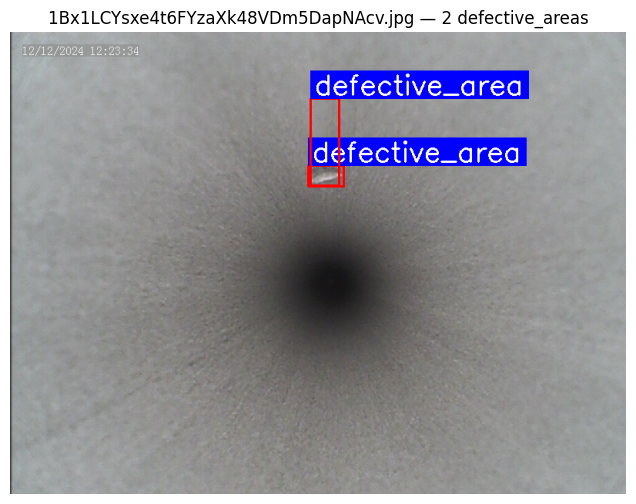

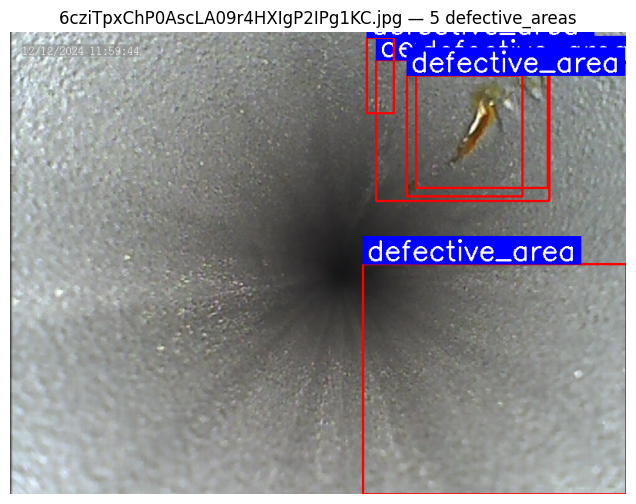

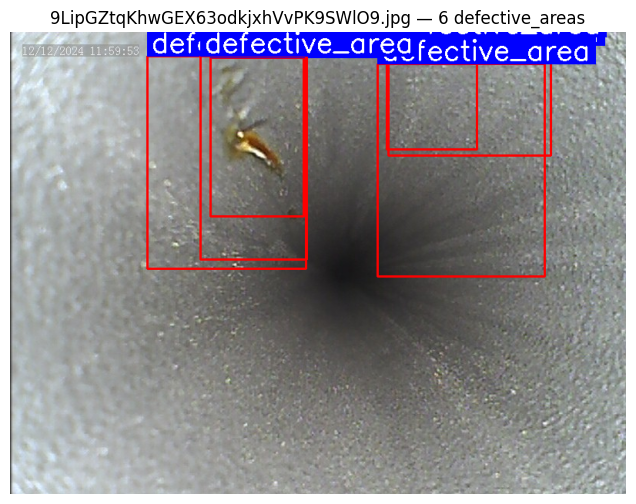

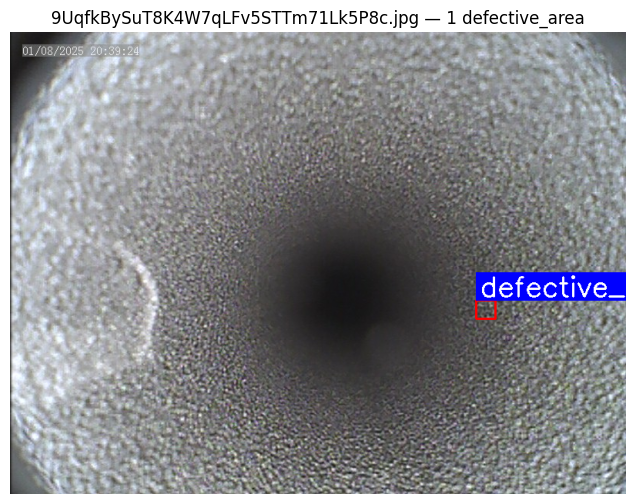

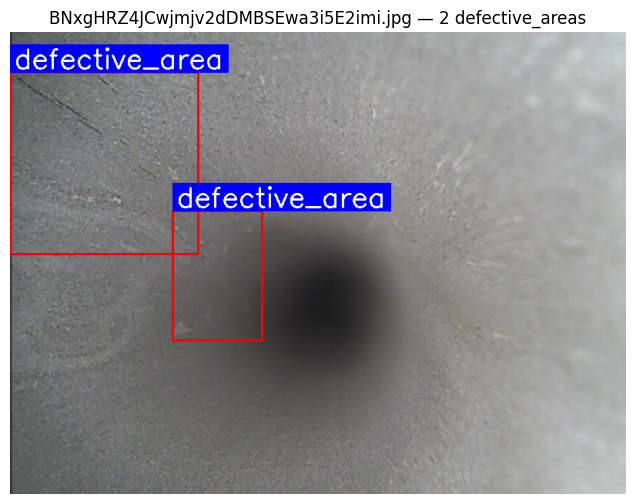

...

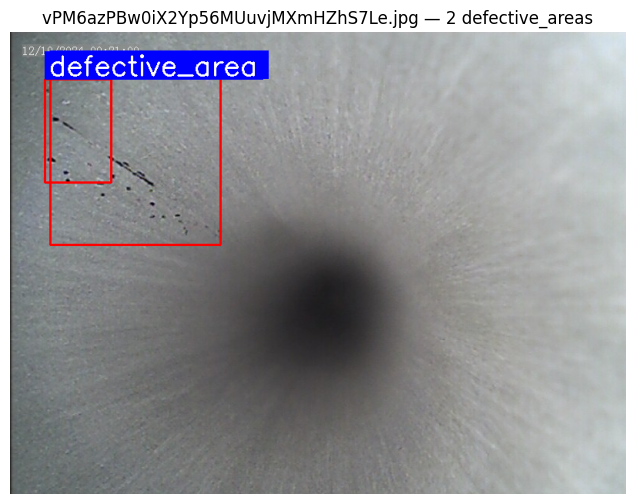

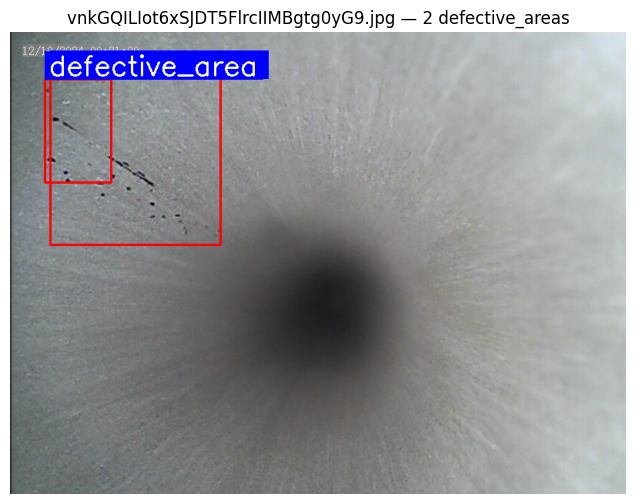

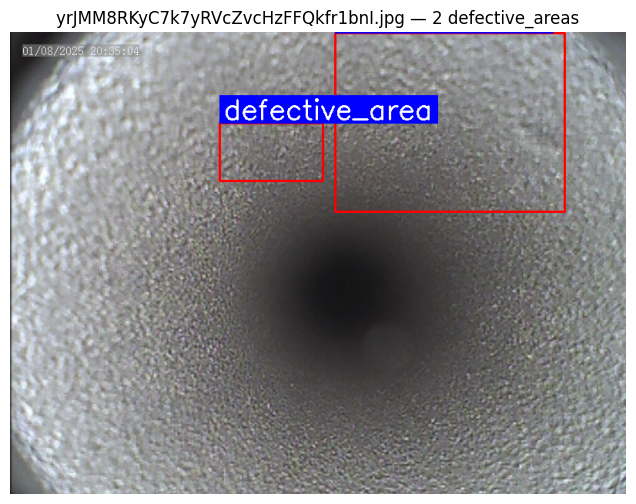

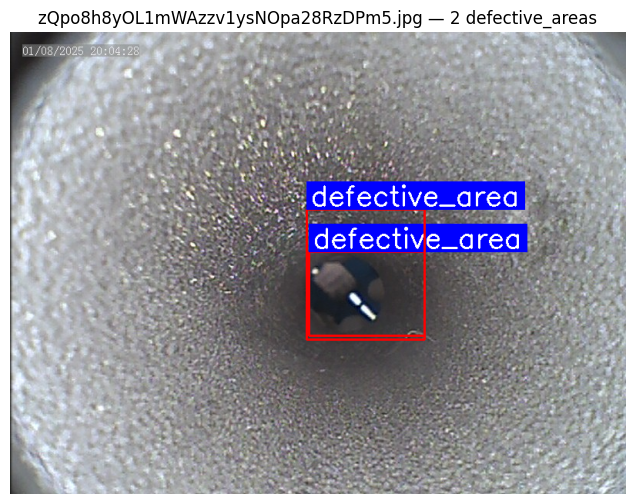

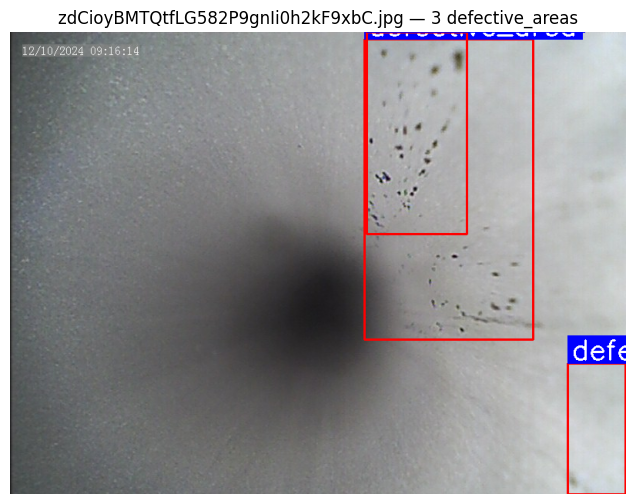

In [8]:
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt
import os

# Load model and move to GPU
model.to('cuda')

# Predict on the dataset
results = model.predict(source="/content/drive/MyDrive/defect_dataset/images", conf=0.25, save=False)

# Function to display image with bounding boxes, filename and count
def display_results(results):
    for result in results:
        img_path = result.path
        image_id = os.path.basename(img_path)
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # Count and draw bounding boxes
        count = 0
        for box in result.boxes:
            cls_id = int(box.cls[0].item())
            label = result.names[cls_id]
            if label == "defective_area":
                count += 1
                # Get box coordinates
                x1, y1, x2, y2 = map(int, box.xyxy[0])
                # Draw rectangle
                cv2.rectangle(img, (x1, y1), (x2, y2), (255, 0, 0), 2)

                # Label background and text
                font_scale = 1.2
                thickness = 2
                font = cv2.FONT_HERSHEY_SIMPLEX

                # Get text size
                (text_width, text_height), baseline = cv2.getTextSize(label, font, font_scale, thickness)
                # Draw filled rectangle (blue background)
                cv2.rectangle(img, (x1, y1 - text_height - 10), (x1 + text_width + 10, y1), (0, 0, 255), -1)
                # Put white text
                cv2.putText(img, label, (x1 + 5, y1 - 5), font, font_scale, (255, 255, 255), thickness)

        # Add image ID and defect count to top of image
        header = f"{image_id} — {count} defective_area{'s' if count != 1 else ''}"
        plt.figure(figsize=(8, 6))
        plt.imshow(img)
        plt.axis('off')
        plt.title(header)
        plt.show()

# Call the function
display_results(results)
